# 5. Image Enhancement Using Derivatives

This notebook will continue to explore image enhancement, as the bridge to edge detection and other complex problems.

Here, we'll examine:<ul><li>gradients as first-order derivatives</li><li>Laplacian (second-order) derivatives</li><li>sharpening and masking</li><li>edge detection using filters</li><li>image pyramids and blending images</li></ul>

## Image Derivatives: Gradient and Laplacian

Derivatives of images are useful in finding places where the intensity / pixel values change sharply in an area, as these areas correspond those in an image derivative where the are peaks or valleys. As such, the peaks in gradient magnitude mark edge locations.  The 1st order (<strong>partial</strong>) derivative is computed thusly with forward and central differences (central being more accurate): 

Forward: $$\frac{\delta f}{\delta x} = f(x + 1) - f(x)$$  

Central: $$\frac{\delta f}{\delta x} = \frac{f(x + 1) - f(x - 1)}{2}$$

And the gradient: $$\nabla f = [\frac{\delta f}{\delta x}, \frac{\delta f}{\delta y}]$$
Magnitude:  $$\Vert{}\nabla f\Vert = \sqrt{(\frac{\delta f}{\delta x})^2 + (\frac{\delta f}{\delta y})^2}$$

In [1]:
import numpy as np
from scipy import signal, misc, ndimage
from skimage import filters, feature, img_as_float
from skimage.io import imread
from skimage.color import rgb2gray
from PIL import Image, ImageFilter
import matplotlib.pylab as plb

In [2]:
def plot_image(image, title):
    plb.imshow(image)
    plb.title(title, size=20)
    plb.axis('off')

From the book, we have an example using a chess board image, to illustrate the point: 
<img src="./img/index_top.png" />
<img src="./img/index.png" />

And with one of my images:

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


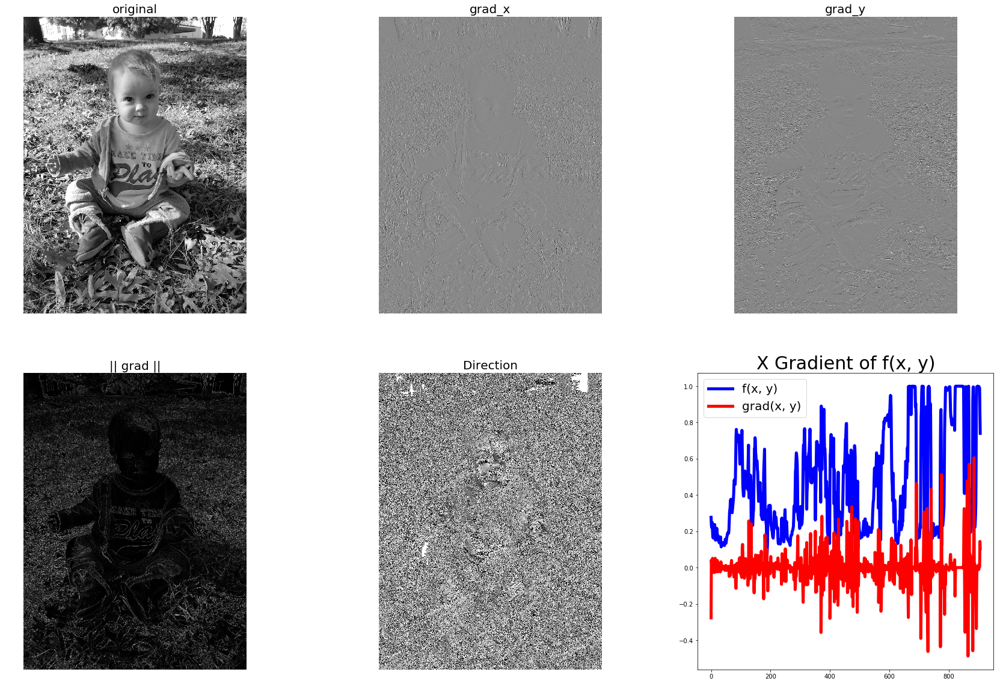

In [4]:
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
img = rgb2gray(imread('./img/Uli.jpg'))
img_x = signal.convolve2d(img, ker_x, mode='same')
img_y = signal.convolve2d(img, ker_y, mode='same')
img_mag = np.sqrt(img_x**2 + im_y**2)
img_dir = np.arctan(img_y/img_x)
plb.gray()
plb.figure(figsize=(30, 20))
plb.subplot(231)
plot_image(img, 'original')
plb.subplot(232)
plot_image(img_x, 'grad_x')
plb.subplot(233)
plot_image(img_y, 'grad_y')
plb.subplot(234)
plot_image(img_mag, '|| grad ||')
plb.subplot(235)
plot_image(img_dir, 'Direction')
plb.subplot(236)
plb.plot(range(img.shape[1]), img[0, :], 'b-', label="f(x, y)", linewidth=5)
plb.plot(range(img.shape[1]), img_x[0, :], 'r-', label="grad(x, y)", linewidth=5)
plb.title("X Gradient of f(x, y)", size=30)
plb.legend(prop={'size': 20})
plb.show()

We can display the magnitude and direction on the same image, showing the magnitude & direction of edges with colors:

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys
No handles with labels found to put in legend.


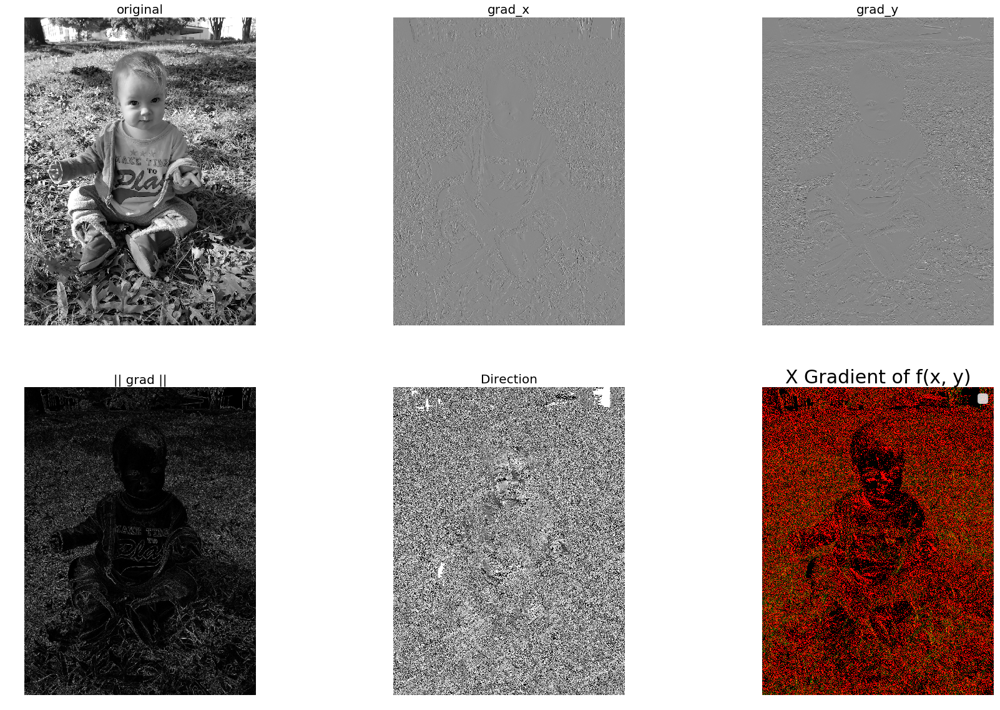

In [6]:
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
img = rgb2gray(imread('./img/Uli.jpg'))
img_x = signal.convolve2d(img, ker_x, mode='same')
img_y = signal.convolve2d(img, ker_y, mode='same')
img_mag = np.sqrt(img_x**2 + im_y**2)
img_dir = np.arctan(img_y/img_x)
plb.gray()
plb.figure(figsize=(30, 20))
plb.subplot(231)
plot_image(img, 'original')
plb.subplot(232)
plot_image(img_x, 'grad_x')
plb.subplot(233)
plot_image(img_y, 'grad_y')
plb.subplot(234)
plot_image(img_mag, '|| grad ||')
plb.subplot(235)
plot_image(img_dir, 'Direction')
plb.subplot(236)
img1 = np.zeros((img.shape[0], img.shape[1], 3))
img1[..., 0] = img_mag * np.sin(img_dir)
img1[..., 1] = img_mag * np.cos(img_dir)
plb.imshow(img1)
plb.title("X Gradient of f(x, y)", size=30)
plb.axis('off')
plb.legend(prop={'size': 20})
plb.show()

In the book I'm reading from, the author included a picture of a tiger, & the high contrast of its stripes illustrated the concept well; this one isn't so obvious, but the baby's face, & facial features, stands out from the rest of the image.

### Laplacian

The Laplacian is a derivative operator that approximates the second derivative of an image, and detects edges. It is <em>isotropic</em> (rotationally invariant), and discovers <strong>zero-crossings</strong> where there are spikes or valleys in the first-order derivative of an image. 

2nd Order Derivative:
$$\frac{\delta^2 f}{\delta x^2} = f(x + 1) + f(x -1) - 2f(x)$$
$$\frac{\delta^2 f}{\delta y^2} = f(y + 1) + f(y -1) - 2f(y)$$

Laplacian:
$$\nabla^2 f = \frac{\delta^2 f}{\delta x^2} + \frac{\delta^2 f}{\delta x^2} = f(x + 1, y) + f(x - 1, y) + f(x, y + 1) + f(x, y - 1) - 4f(x, y)$$

While the gradient produces vectors, with directions and magnitude, the Laplacian results in a scalar, which is why it's isotropic. This also makes it sensitve to noise, and so it's always preceded by a smoothing operation.

Let's get to it.

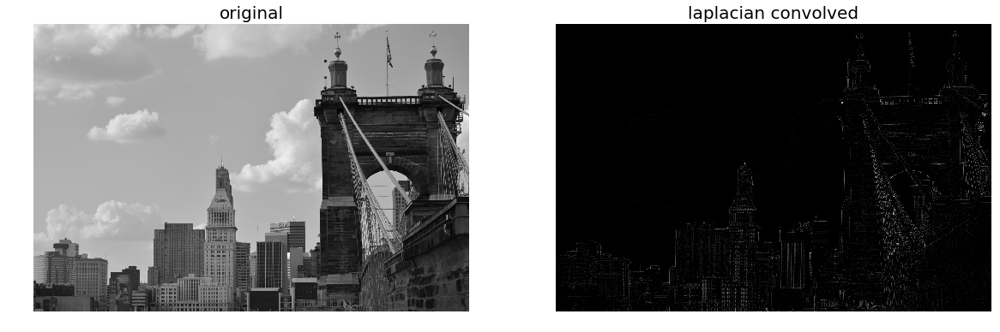

In [12]:
ker_laplacian = [[0, -1, 0], [-1, 4, -1], [0, -1, 0]]
img = rgb2gray(imread('./img/roebling2.jpeg'))
img1 = np.clip(signal.convolve2d(img, ker_laplacian, mode='same'), 0, 1)
plb.gray()
plb.figure(figsize=(20, 10))
plb.subplot(121)
plot_image(img, 'original')
plb.subplot(122)
plot_image(img1, 'laplacian convolved')
plb.show()

### Sharpening with Laplacian

Now we'll apply the Laplacian derivative to sharpening operations. To do this we'll apply the filter, then add the output to the input. For this we'll use scikit-images `filters` submodule, specifically, `laplace'.

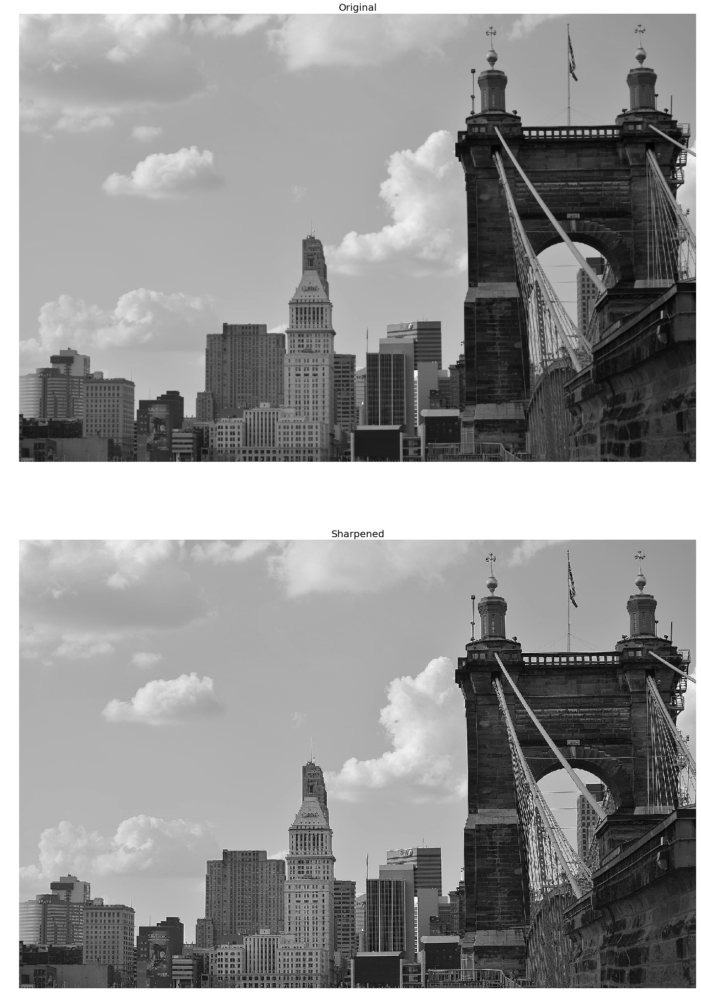

In [14]:
from skimage.filters import laplace
img = rgb2gray(imread('./img/roebling2.jpeg'))
img1 = np.clip(laplace(img) + img, 0, 1)
plb.figure(figsize=(20, 30))
plb.subplot(211)
plot_image(img, 'Original')
plb.subplot(212)
plot_image(img1, 'Sharpened')
plb.tight_layout()
plb.show()

#### Unsharp Masking

This is a similar process, but with this we'll <em>subtract</em> a blurred image from the original

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


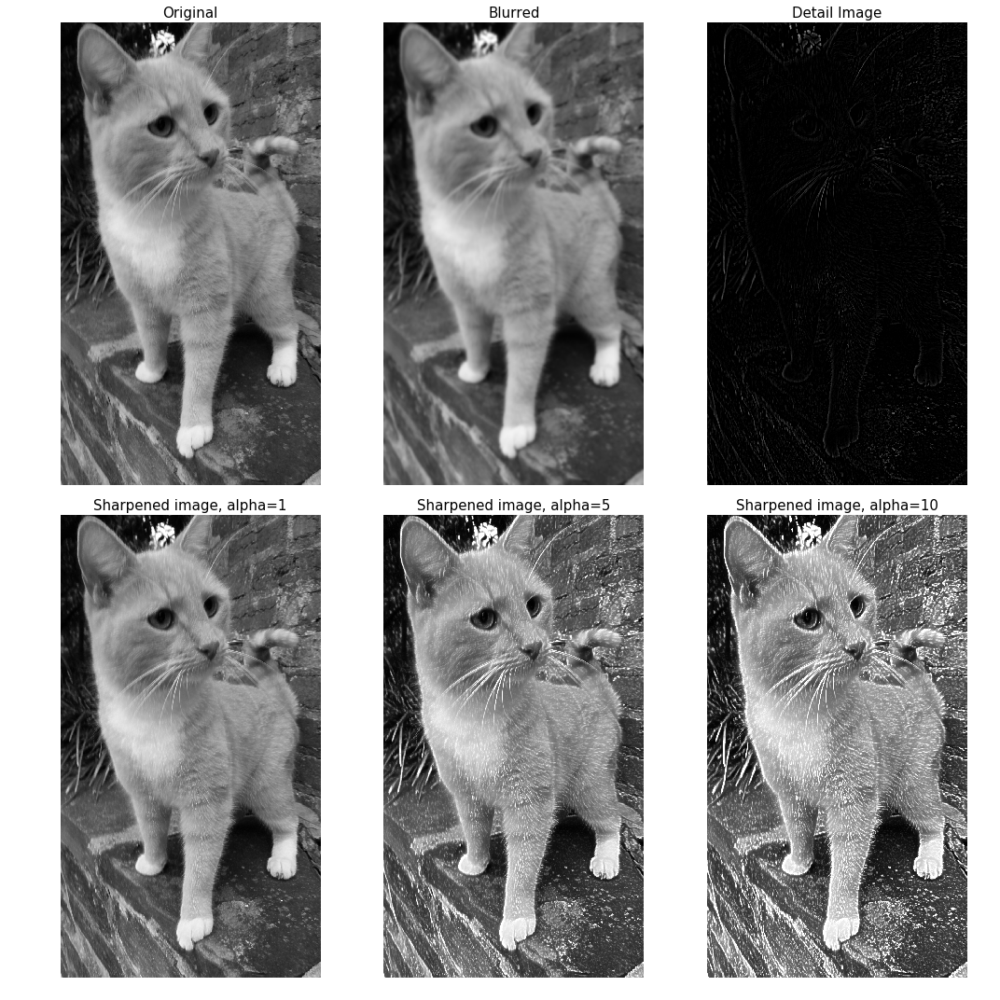

In [16]:
def rgb2gray(img):
    return np.clip(0.2989 * img[..., 0] + 0.5870 * img[..., 1] + 0.1140 * img[..., 2], 0, 1)

img = rgb2gray(img_as_float(misc.imread('./img/kolya.jpg')))
img_blurred = ndimage.gaussian_filter(img, 5)
img_detail = np.clip(img - img_blurred, 0, 1)
plb.gray()
fig, axes = plb.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(15, 15))
axes = axes.ravel()
axes[0].set_title('Original', size=15)
axes[0].imshow(img)
axes[1].set_title('Blurred', size=15)
axes[1].imshow(img_blurred)
axes[2].set_title('Detail Image', size=15)
axes[2].imshow(img_detail)
# now we'll play with alpha values to fine-tune the sharpening process
alpha = [1, 5, 10]
for i in range(3):
    img_sharp = np.clip(img + alpha[i] * img_detail, 0, 1)
    axes[3+i].imshow(img_sharp)
    axes[3+i].set_title('Sharpened image, alpha={}'.format(alpha[i]), size=15)
for ax in axes:
    ax.axis('off')
fig.tight_layout()
plb.show()

### Edge Detection Using Derivatives and Filters

We've been approaching this topic for awhile, and by now it's a bit simple: to find an edge we look at the parts of hte image where there's a change in pixel values (intensity). Right now we'll limit ourselves to 2d image-arrays (grayscale) as inputs. What results from the edge-detection process? Curves. Hmm.

To accomplish this we turn to the gradient magnitude, or the strength of the edges. Programmatically, we will turn first to the Sobel edge detector and its operators:

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


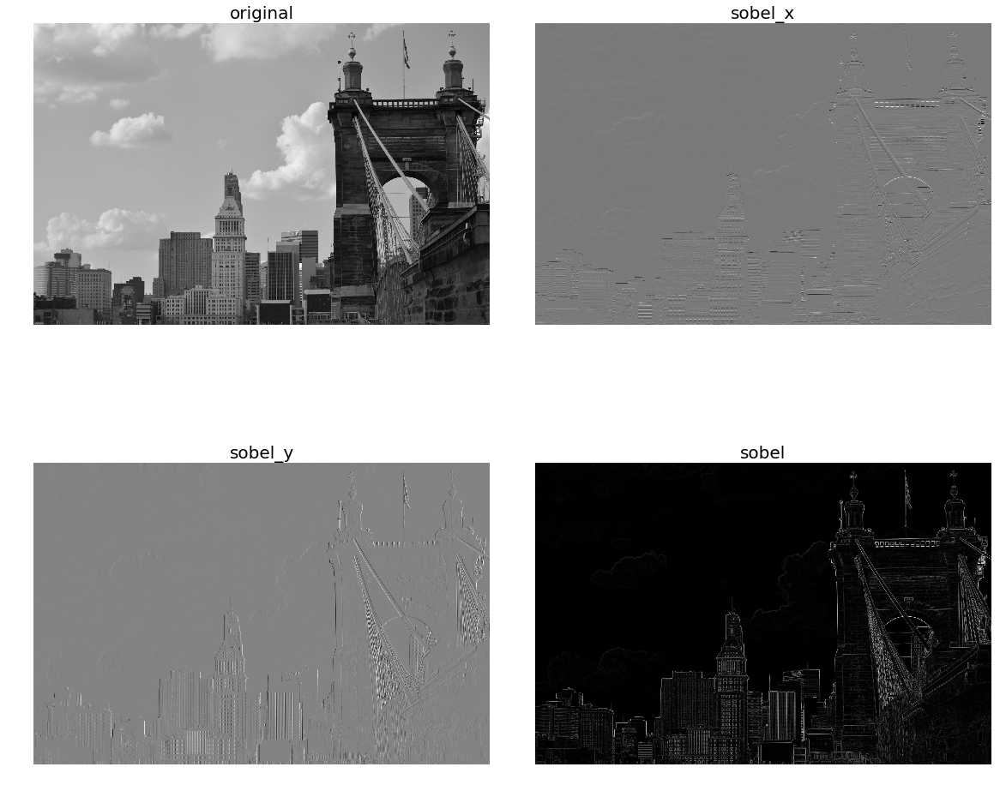

In [22]:
img = rgb2gray(img_as_float(misc.imread('./img/roebling2.jpeg')))
plb.gray()
plb.figure(figsize=(20, 18))
plb.subplot(2, 2, 1)
plot_image(img, 'original')
plb.subplot(2, 2, 2)
edges_x = filters.sobel_h(img)
plot_image(edges_x, 'sobel_x')
plb.subplot(2, 2, 3)
edges_y = filters.sobel_v(img)
plot_image(edges_y, 'sobel_y')
plb.subplot(2, 2, 4)
edges = filters.sobel(img)
plot_image(edges, 'sobel')
plb.subplots_adjust(wspace=0.1, hspace=0.1)
plb.show()

#### Other Edge Detectors in Scikit-Image: Prewitt, Roberts, Scharr, and Laplace

There are other edge detectors in the scikit-image library, and all but Laplace are first-order derivative-based. Where they differ is in their kernels, which in turn affect their performance. The Scharr filter results in less rotational variance than Sobel, and both in general outperform the Prewitt:

<img src="./img/filters.png" />

Let's try them out and compare on the Cincnnati skyline.

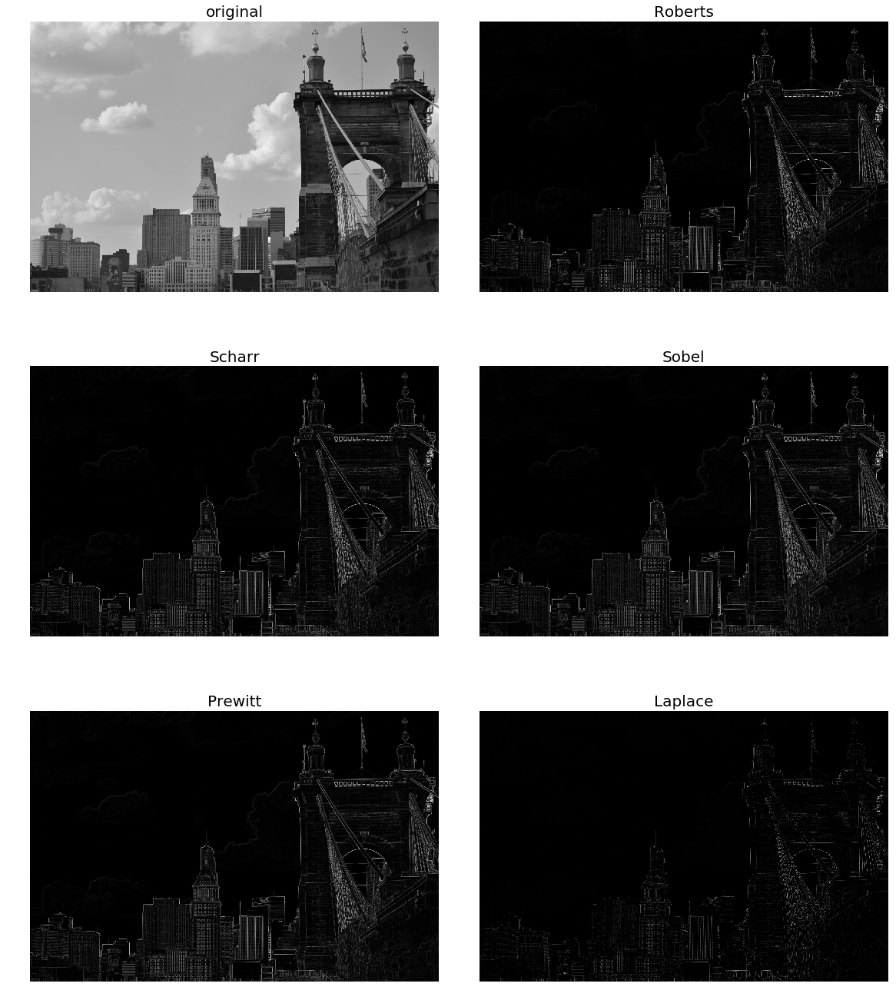

In [23]:
plb.gray()
plb.figure(figsize=(20, 24))
plb.subplot(3, 2, 1)
plot_image(img, 'original')
edges = filters.roberts(img)
plb.subplot(3, 2, 2)
plot_image(edges, 'Roberts')
edges = filters.scharr(img)
plb.subplot(3, 2, 3)
plot_image(edges, 'Scharr')
edges = filters.sobel(img)
plb.subplot(3, 2, 4)
plot_image(edges, 'Sobel')
edges = filters.prewitt(img)
plb.subplot(3, 2, 5)
plot_image(edges, 'Prewitt')
edges = np.clip(filters.laplace(img), 0, 1)
plb.subplot(3, 2, 6)
plot_image(edges, 'Laplace')
plb.subplots_adjust(wspace=0.1, hspace=0.1)
plb.show()

For each of these, we would need to peform <strong>non-maximum suppression</strong> to thin the thicker edges down to a pixel. The <em>Canny</em> edge detector does this for us, as well as performing smoothing and some thresholding that links edges based on their strength.

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


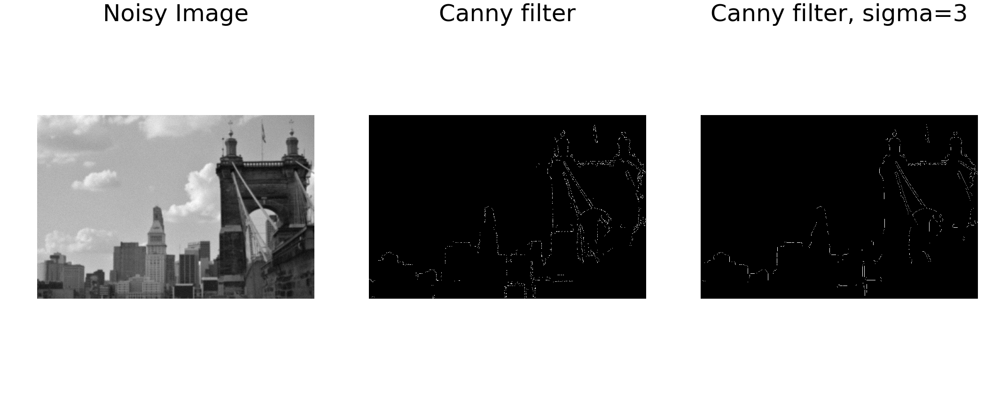

In [27]:
img = rgb2gray(img_as_float(misc.imread('./img/roebling2.jpeg')))
img = ndimage.gaussian_filter(img, 4)
img += 0.05 * np.random.random(img.shape)
edges1 = feature.canny(img)
edges2 = feature.canny(img, sigma=3)
fig, axes = plb.subplots(nrows=1, ncols=3, figsize=(30, 12), sharex=True, sharey=True)
axes[0].imshow(img)
axes[0].axis('off')
axes[0].set_title("Noisy Image", fontsize=50)
axes[1].imshow(edges1)
axes[1].axis('off')
axes[1].set_title('Canny filter', fontsize=50)
axes[2].imshow(edges2)
axes[2].axis('off')
axes[2].set_title("Canny filter, sigma=3", fontsize=50)
fig.tight_layout()
plb.show()

### LoG and DoG

<strong>Laplacian of Gaussian</strong> is, by now, exactly what it sounds like (this morning I wouldn't have understood that): we run the Gaussian filter over an image and then the Laplacian filter. The <strong>Difference of two Gaussians</strong> approximates the LoG. Here's how we compute the LOG filter & corresponding DoG approximation:

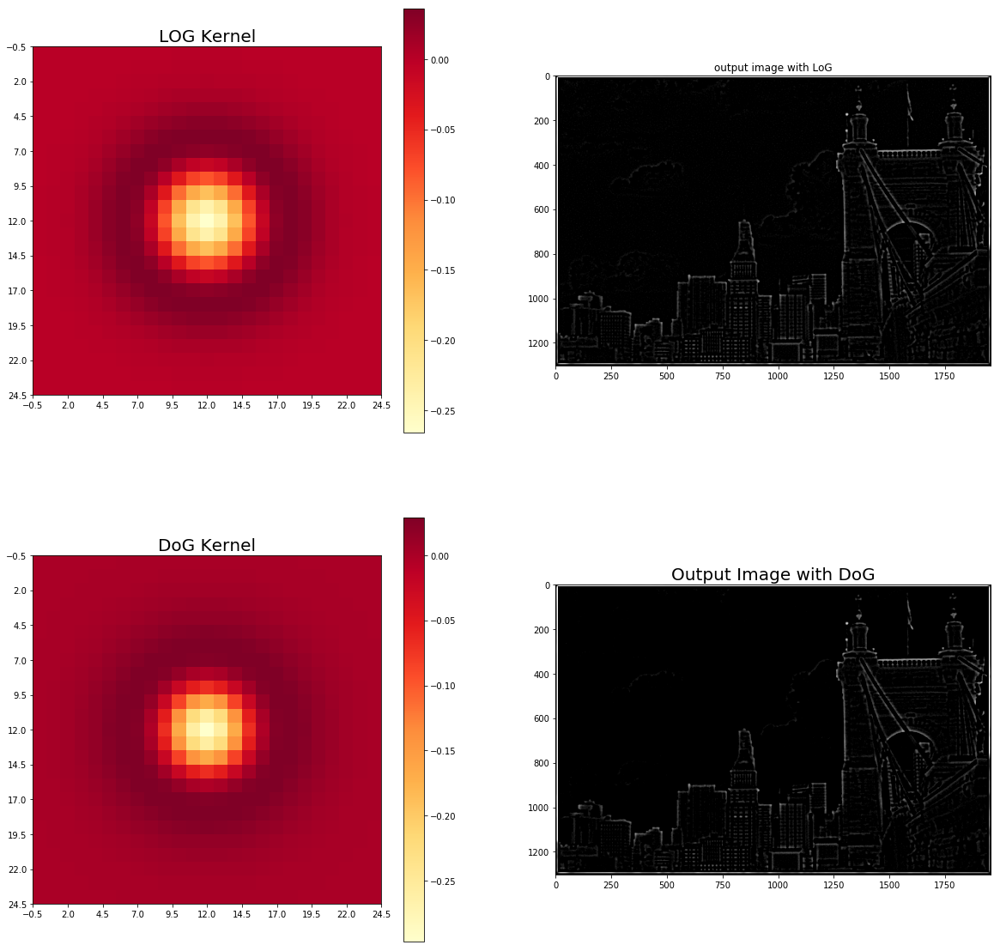

In [29]:
from math import pi

def plot_kernel(kernel, s, name):
    plb.imshow(kernel, cmap='YlOrRd')
    ax = plb.gca()
    ax.set_xticks(np.arange(-0.5, kernel.shape[0], 2.5))
    ax.set_yticks(np.arange(-0.5, kernel.shape[1], 2.5))
    plb.colorbar()
    
def LOG(k=12, s=3):
    n = 2 * k + 1
    kernel = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            kernel[i, j] = -(1 - ((i - k)**2 + (j-k)**2) / (2.*s**2)) * np.exp(-((i - k)**2 + (j - k)**2) / 
                                                                              (2.*s**2))/(pi*s**4)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()), 3)
    return kernel

def DOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    s1, s2 = s * np.sqrt(2), s / np.sqrt(2)
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = np.exp(-((i-k)**2+(j-k)**2)/(2.*s1**2))/(2*pi*s1**2) - np.exp(-((i-k)**2+(j-k)**2)/
                                                                                        (2.*s2**2))/(2*pi*s2**2)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

s = 3
kernel = LOG()
outimg = signal.convolve2d(img, kernel)
plb.figure(figsize=(20, 20))
plb.subplot(221)
plb.title('LOG Kernel', size=20)
plot_kernel(kernel, s, 'LOG')
plb.subplot(222)
plb.title('output image with LoG')
plb.imshow(np.clip(outimg, 0, 1), cmap='gray')
kernel = DOG()
outimg = signal.convolve2d(img, kernel)
plb.subplot(223)
plb.title('DoG Kernel', size=20)
plot_kernel(kernel, s, 'DoG')
plb.subplot(224)
plb.title('Output Image with DoG', size=20)
plb.imshow(np.clip(outimg, 0, 1))
plb.show()

#### Implementing LoG with Scipy ndimage

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


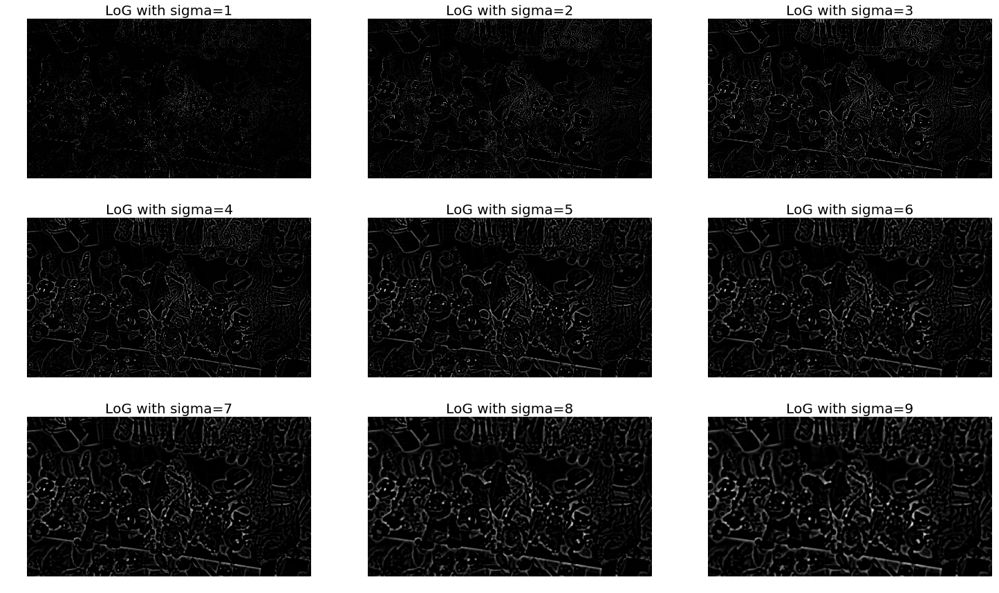

In [30]:
img = rgb2gray(img_as_float(misc.imread('./img/toys.jpg')))
fig = plb.figure(figsize=(25, 15))
plb.gray()
for sigma in range(1, 10):
    plb.subplot(3, 3, sigma)
    img_log = ndimage.gaussian_laplace(img, sigma=sigma)
    plb.imshow(np.clip(img_log, 0, 1))
    plb.axis('off')
    plb.title('LoG with sigma={}'.format(sigma), size=20)
plb.show()

#### Edge Detection Using the Marr-Hildreth Algorithm

Remember the zero-crossings we found with the help of the Laplacian filter? Well, the two who developed this algorithm found that edge pixels can be detected by viewin ghte sign of hte LoG-smoothed image, by defining it as a binary image. To compute the zero-crossing, we:<ul><li>convert the LoG-convolved image to a binary one, replacing positive values with 1, and negative values with 0</li><li>the non-zero regions will now contain zero-crossing pixels</li><li>we can find boundaries by finding non-zero pixels that are adjacent to a zero pixel</li><li>for each 1-pixel, if any neighboring pixel is zero, then our pixel is on an edge</li></ul>

#### Implementing Edge Detection with PIL

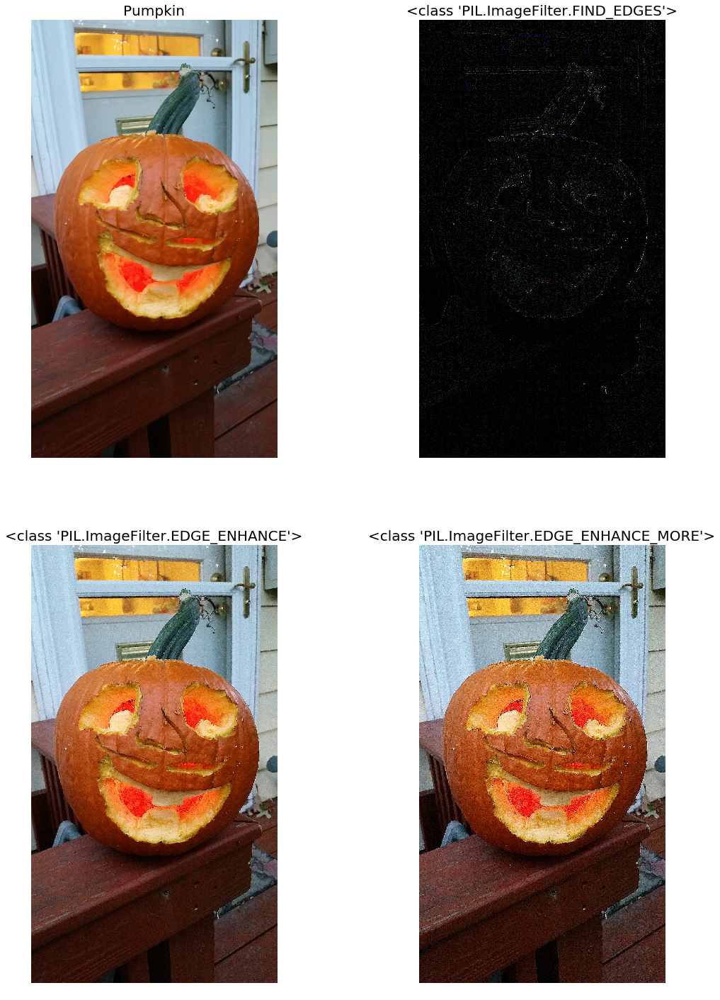

In [32]:
from PIL.ImageFilter import FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE
img = Image.open('./img/pumpkin.jpg')
plb.figure(figsize=(18, 25))
plb.subplot(2, 2, 1)
plot_image(img, 'Pumpkin')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    plb.subplot(2, 2, i)
    img1 = img.filter(f)
    plot_image(img1, str(f))
    i += 1
plb.show()

### Image Pyramids & Blending Images

Building image pyramids is a step in preprocessing that optimize searching over a scale, precomputation, and editing frequency bands. It refers to the process of iteratively creating smaller and smaller copies of an image until a defined minimum resolution is reached. If you've loaded images in ArcMap, it asks if you want to do this in order to be able to more quickly render images at different scales. This is implemented in scikit-image through the `transform.pyramid` module's `pyramid_gaussian()` function.

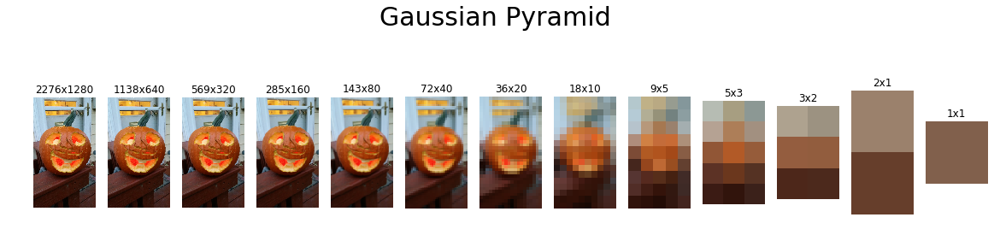

In [37]:
from skimage import transform
img = imread('./img/pumpkin.jpg')
rows, cols, dim = img.shape
nrows, ncols = img.shape[:2]
pyramid = tuple(transform.pyramid_gaussian(img, downscale=2))
plb.figure(figsize=(20, 5))
i, n = 1, len(pyramid)
for p in pyramid:
    plb.subplot(1, n, i)
    plb.imshow(p)
    plb.title('{}x{}'.format(p.shape[0], p.shape[1]))
    plb.axis('off')
    i += 1
plb.suptitle('Gaussian Pyramid', size=30)
plb.show()